In [1]:
!pip install diffusers transformers fastcore

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 236 kB 26.9 MB/s 
     |████████████████████████████████| 5.3 MB 50.9 MB/s 
     |████████████████████████████████| 163 kB 70.1 MB/s 
     |████████████████████████████████| 7.6 MB 52.8 MB/s 


In [3]:
from PIL import Image
from fastcore.all import concat
import torch, logging
from pathlib import Path
from huggingface_hub import notebook_login
from diffusers import StableDiffusionPipeline
from PIL import Image
import matplotlib.pyplot as plt
logging.disable(logging.WARNING)

torch.manual_seed(1)
if not (Path.home()/'.huggingface'/'token').exists(): notebook_login()

Login successful
Your token has been saved to /root/.huggingface/token


In [4]:
pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", revision="fp16", torch_dtype=torch.float16).to("cuda")

Downloading:   0%|          | 0.00/543 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

Downloading:   0%|          | 0.00/342 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/4.63k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/608M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/209 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/209 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/572 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/246M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/525k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/472 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/788 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/772 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/550 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/167M [00:00<?, ?B/s]

In [5]:
prompt = "a photograph of an astronaut on a skateboard"

  0%|          | 0/51 [00:00<?, ?it/s]

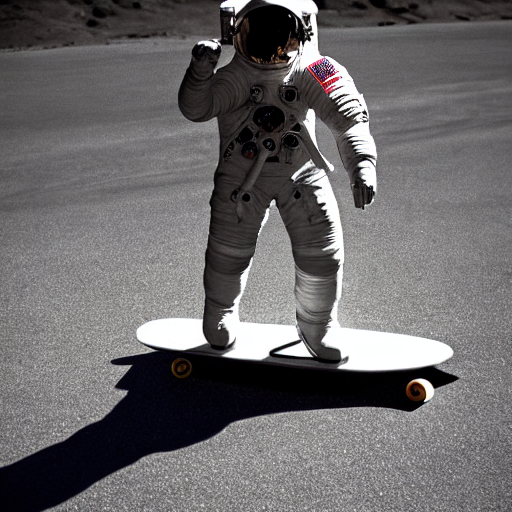

In [6]:
torch.manual_seed(123)
pipe(prompt).images[0]

  0%|          | 0/4 [00:00<?, ?it/s]

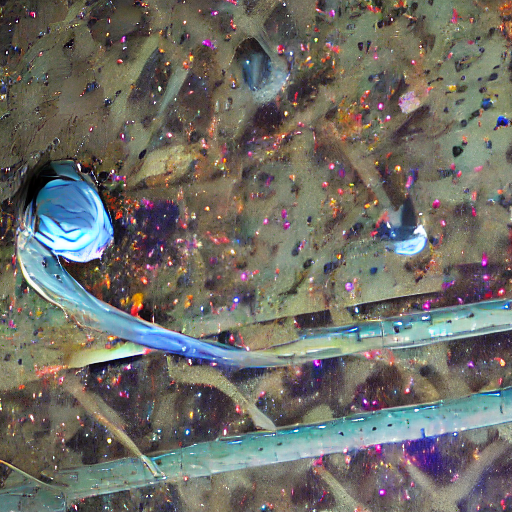

In [7]:
torch.manual_seed(123)
pipe(prompt, num_inference_steps=3).images[0]

  0%|          | 0/6 [00:00<?, ?it/s]

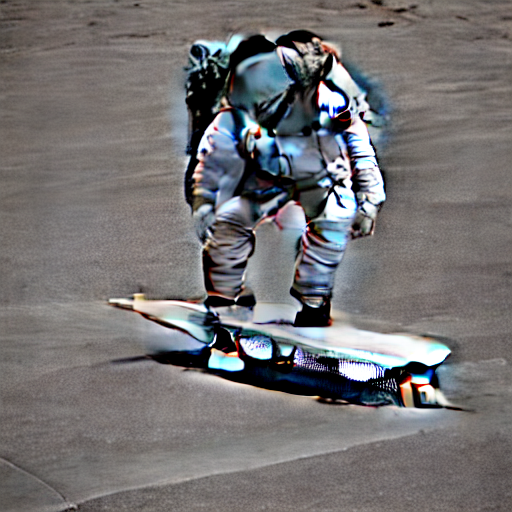

In [8]:
torch.manual_seed(123)
pipe(prompt, num_inference_steps=5).images[0]

  0%|          | 0/17 [00:00<?, ?it/s]

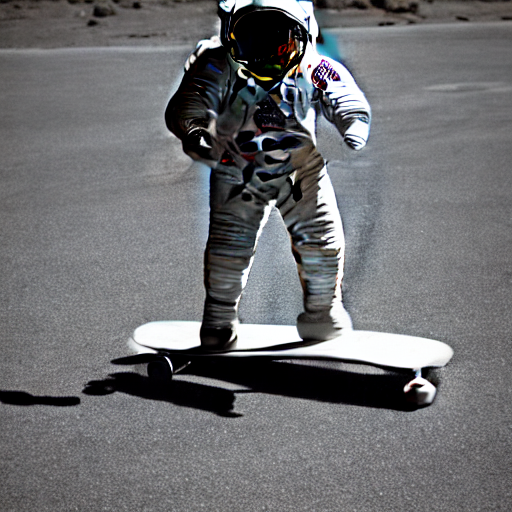

In [9]:
torch.manual_seed(123)
pipe(prompt, num_inference_steps=16).images[0]

In [10]:
def image_grid(imgs, rows, cols):
    w,h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    for i, img in enumerate(imgs): grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

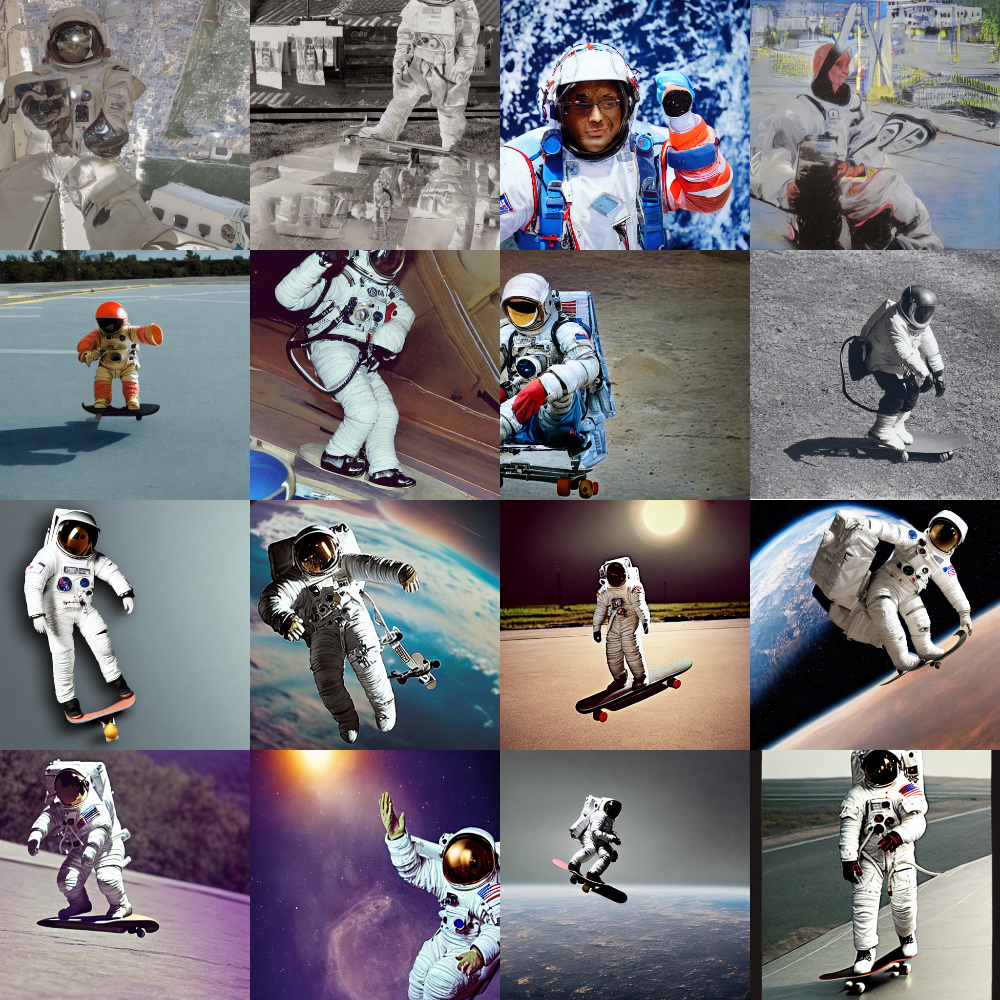

In [11]:
num_rows, num_cols = 4, 4
prompts = [prompt] * num_cols
images = concat(pipe(prompts, guidance_scale=g).images for g in [1, 3, 7, 10, 14])
image_grid(images, rows=num_rows, cols=num_cols)

  0%|          | 0/51 [00:00<?, ?it/s]

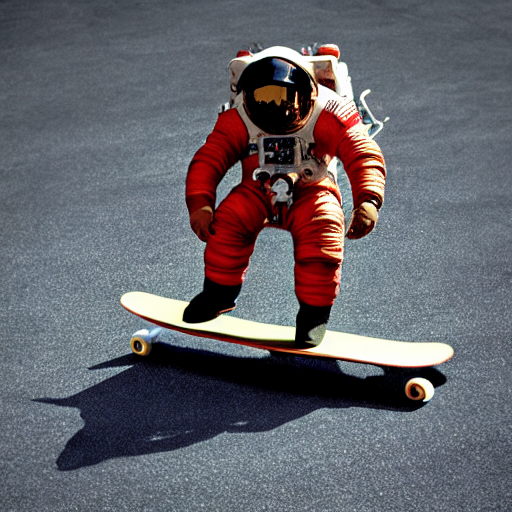

In [12]:
torch.manual_seed(123)
pipe(prompt, negative_prompt="white").images[0]

In [13]:
from diffusers import StableDiffusionImg2ImgPipeline
from fastdownload import FastDownload

pipei2i = StableDiffusionImg2ImgPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4", 
    revision="fp16", 
    torch_dtype=torch.float16
    ).to("cuda")

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

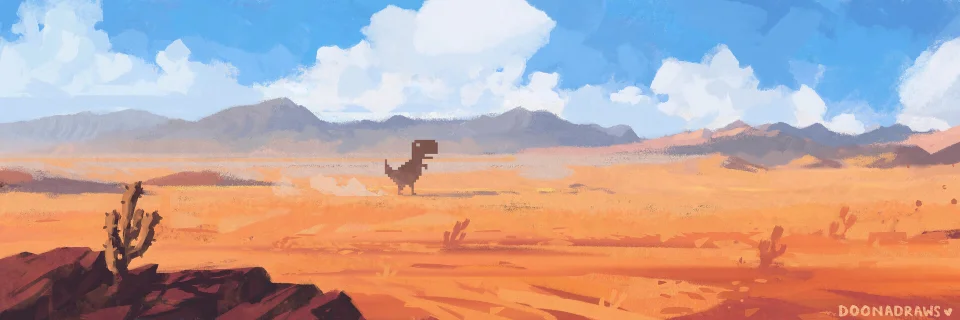

In [14]:
p = FastDownload().download("https://preview.redd.it/gp3lynz4vdl61.jpg?width=960&crop=smart&auto=webp&s=1f53a77ee7bcc8b929e89c8c3259fd410682e67e")
init_image = Image.open(p).convert("RGB")
init_image

  0%|          | 0/41 [00:00<?, ?it/s]

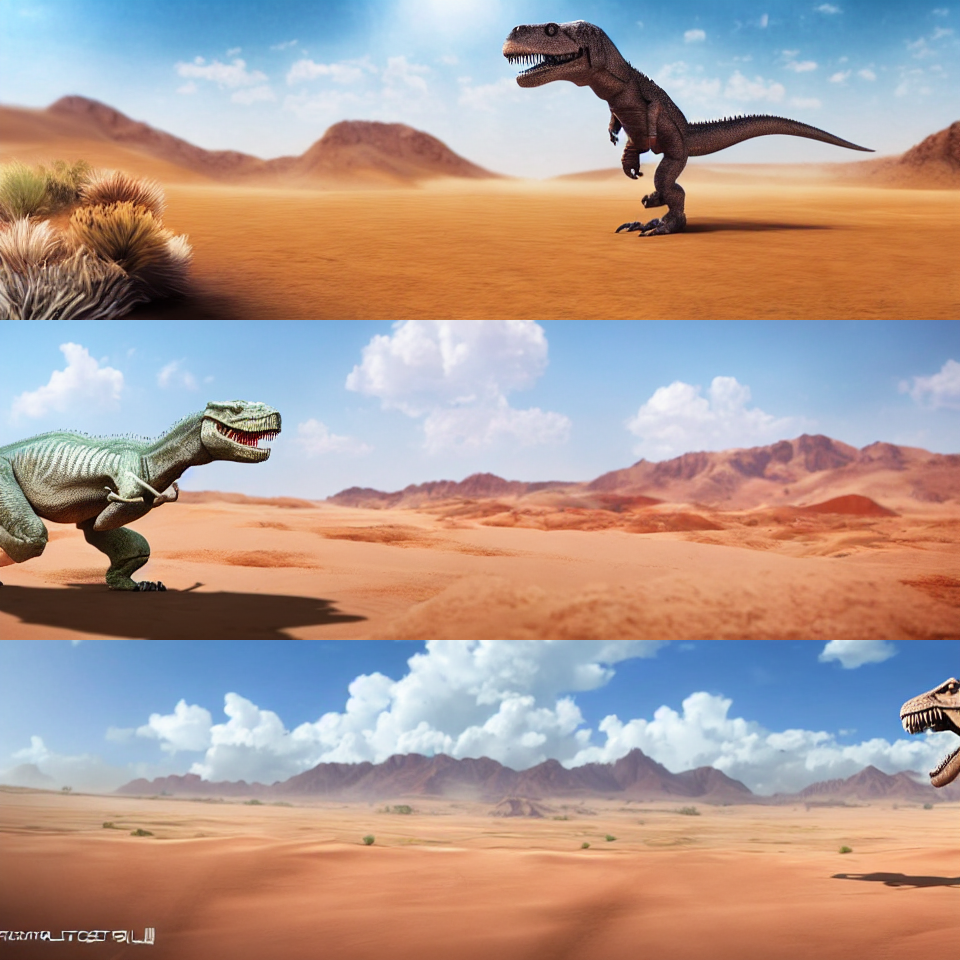

In [15]:
torch.manual_seed(100)
prompt = "T-Rex in a desert, photorealistic 4K"
images = pipei2i(
    prompt=prompt,
    num_images_per_prompt=3,
    init_image=init_image,
    strength=0.8,
    num_inference_steps=50
).images
image_grid(images, rows=3, cols=1)

  0%|          | 0/41 [00:00<?, ?it/s]

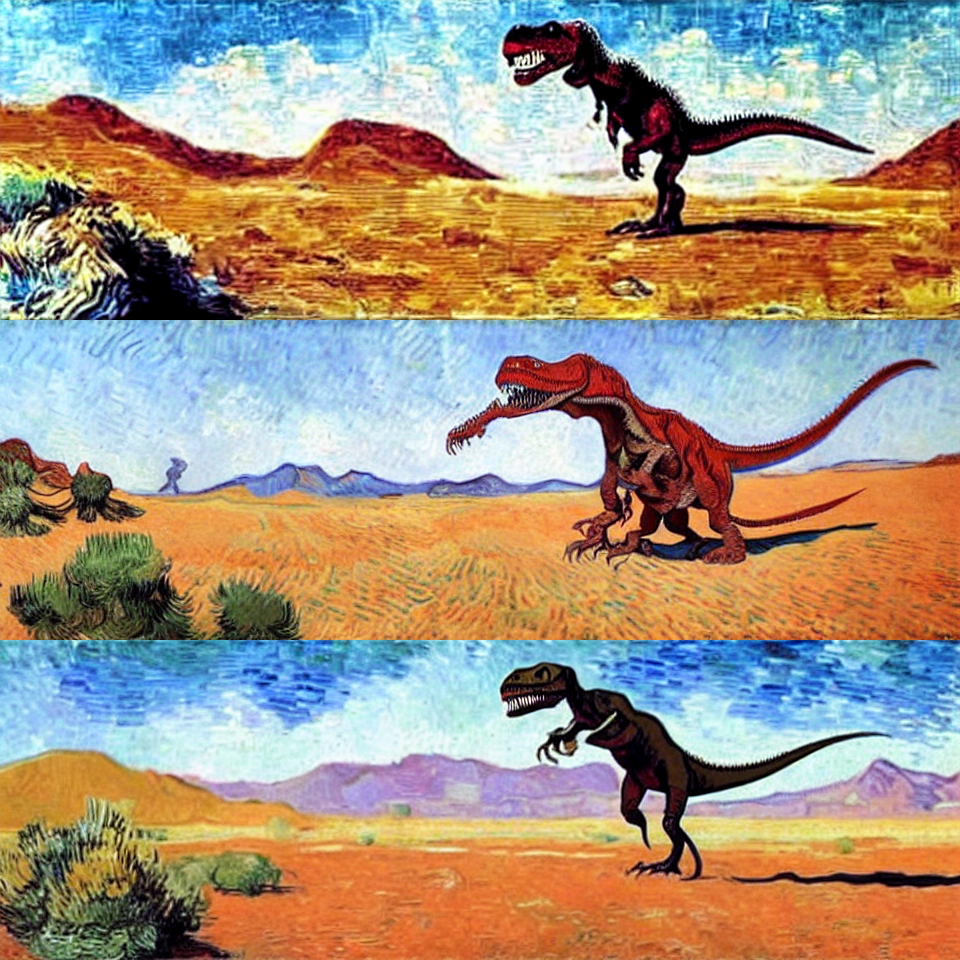

In [16]:
torch.manual_seed(100)
init_image = images[0]
prompt = "Oil painting of a T-Rex in desert by Van Gogh"
images = pipei2i(
    prompt=prompt,
    num_images_per_prompt=3,
    init_image=init_image,
    strength=0.8,
    num_inference_steps=50
).images
image_grid(images, rows=3, cols=1)

In [17]:
embeds_url = "https://huggingface.co/sd-concepts-library/birb-style/resolve/main/learned_embeds.bin"
embeds_path = FastDownload().download(embeds_url)
embeds_dict = torch.load(str(embeds_path), map_location="cpu")

In [18]:
tokenizer = pipe.tokenizer
text_encoder = pipe.text_encoder
new_token, embeds = next(iter(embeds_dict.items()))
embeds = embeds.to(text_encoder.dtype)
new_token

'<birb-style>'

In [19]:
assert tokenizer.add_tokens(new_token) == 1, "The token already exists!"

In [20]:
text_encoder.resize_token_embeddings(len(tokenizer))
new_token_id = tokenizer.convert_tokens_to_ids(new_token)
text_encoder.get_input_embeddings().weight.data[new_token_id] = embeds

  0%|          | 0/51 [00:00<?, ?it/s]

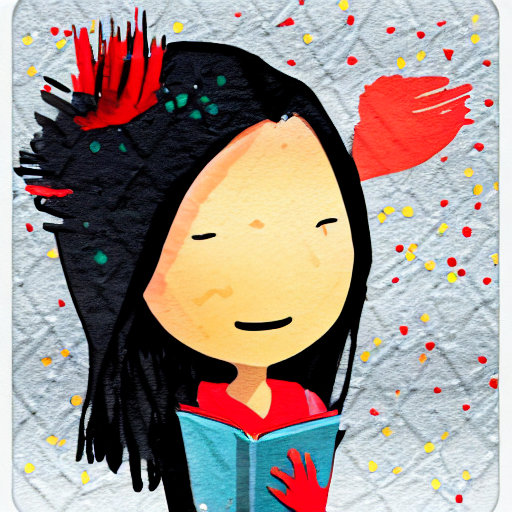

In [21]:
torch.manual_seed(100)
image = pipe("Woman reading in the style of <birb-style>").images[0]
image